# ESM-FCN BE
---
## Predicted vs Measured
### Extracting the values
This was performed in the script `fig3-esm_fcn_be-r2_values.py`.

### Extracting Wildtype Binding and Expression 
To have our comparison to the wildtype values, we need to extract the predictions. We'll find the average value for each binding and expression and plot them on the scatter plot. From this, we can get the R^2 values.

In [1]:
import os
import pandas as pd

data_dir = "../../../../data/dms/original"
binding_df = pd.read_csv(os.path.join(data_dir, "binding_Kds.csv"), sep=',', header=0)
binding_df = binding_df.dropna(subset=['log10Ka']).reset_index(drop=True)
wildtype_b_df = binding_df[binding_df['variant_class'].str.contains('wildtype', case=False, na=False)]
wildtype_b_df = wildtype_b_df[['target', 'variant_class', 'aa_substitutions', 'log10Ka']].copy()
wildtype_b_df['mean_log10Ka'] = wildtype_b_df.groupby('target')['log10Ka'].transform('mean')
binding_wt = wildtype_b_df['mean_log10Ka'][8] 

expression_df = pd.read_csv(os.path.join(data_dir, "expression_meanFs.csv"), sep=',', header=0)
expression_df = expression_df.dropna(subset=['ML_meanF']).reset_index(drop=True)
wildtype_e_df = expression_df[expression_df['variant_class'].str.contains('wildtype', case=False, na=False)]
wildtype_e_df = wildtype_e_df[['target', 'variant_class', 'aa_substitutions', 'ML_meanF']].copy()
wildtype_e_df['mean_ML_meanF'] = wildtype_e_df.groupby('target')['ML_meanF'].transform('mean')
expression_wt = wildtype_e_df['mean_ML_meanF'][11]

print(f"WT binding: {binding_wt}, WT expression: {expression_wt}")

WT binding: 10.792732335537766, WT expression: 10.29234282907662


### Plotting Predicted vs Measured Scatterplot
Binding

In [26]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

def plot_predicted_value_scatter_with_threshold(merged_df, binding_or_expression, title, save_path, wt_loc, threshold_percent=10):
    sns.set_style('ticks')
    sns.set_context('poster')
    plt.figure(figsize=(16, 10.25))
    ax = plt.gca()

    if binding_or_expression.lower() == "binding":
        measured = "binding_measured_value"
        predicted = "binding_predicted_value"
    elif binding_or_expression.lower() == "expression":
        measured = "expression_measured_value"
        predicted = "expression_predicted_value"

    # Calculate the threshold as 10% of measured values
    merged_df['threshold'] = merged_df[measured] * (threshold_percent/100)
    merged_df['abs_diff'] = np.abs(merged_df[measured] - merged_df[predicted])
    
    # Separate data based on the relative threshold
    within_threshold = merged_df[merged_df['abs_diff'] <= merged_df['threshold']]
    outside_threshold = merged_df[merged_df['abs_diff'] > merged_df['threshold']]

    # Calculate R² for test data
    train_all_df = merged_df[merged_df['mode'] == 'train']
    test_all_df = merged_df[merged_df['mode'] == 'test']
    r2_value = r2_score(test_all_df[measured], test_all_df[predicted])
    print(f"R^2: {r2_value}")

    train_outside_df = outside_threshold[outside_threshold['mode'] == 'train']
    test_outside_df = outside_threshold[outside_threshold['mode'] == 'test']
    r2_outside_value = r2_score(test_outside_df[measured], test_outside_df[predicted])
    print(f"R^2 outside of threshold: {r2_outside_value}")

    train_inside_df = within_threshold[within_threshold['mode'] == 'train']
    test_inside_df = within_threshold[within_threshold['mode'] == 'test']
    r2_inside_value = r2_score(test_inside_df[measured], test_inside_df[predicted])
    print(f"R^2 inside of threshold: {r2_inside_value}")

    # Plot train and test data within threshold
    marker_size = 35

    sns.scatterplot(
        x=test_inside_df[measured],
        y=test_inside_df[predicted],
        s=marker_size,
        color="tab:orange",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label="Test =<10%"
    )

    sns.scatterplot(
        x=train_inside_df[measured],
        y=train_inside_df[predicted],
        s=marker_size,
        color="tab:blue",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label="Train =<10%"
    )

    # Plot train and test data outside threshold (greyed out)
    sns.scatterplot(
        data=outside_threshold,
        x=measured,
        y=predicted,
        s=marker_size,
        color="gray",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label=">10%"
    )
    print(f"Number of TRAIN points outside of error threshold: {len(train_outside_df)}, or {(len(train_outside_df)/len(train_all_df))*100:.2f}% of all train points")
    print(f"Number of TEST points outside of error threshold: {len(test_outside_df)}, or {(len(test_outside_df)/len(test_all_df))*100:.2f}% of all test points")

    # Add vertical line wildtype loc
    plt.axvline(x=wt_loc, color='black', linestyle='-', linewidth=2)
    plt.text(
        wt_loc, 4.5, 'wt', 
        verticalalignment='bottom',
        horizontalalignment='center',
        )

    plt.xlim(5.25, 11.5)
    plt.ylim(5.25, 11.5)
    plt.xlabel(f"Measured {binding_or_expression}")
    plt.ylabel(f"Predicted {binding_or_expression}")
    plt.title(f"{title}\nR² = {r2_value:.4f}")
    plt.legend(loc="upper left", markerscale=3)
    plt.grid(axis="y", linestyle="--", alpha=0.7)
    plt.grid(axis="x", linestyle="--", alpha=0.7)

    plt.savefig(f"{save_path}.pdf", format='pdf', dpi=600, bbox_inches='tight')
    plt.savefig(f"{save_path}.png", format='png', dpi=600, bbox_inches='tight')
    return r2_value

R^2: 0.5744161038160776
R^2 outside of threshold: -0.28741792707345093
R^2 inside of threshold: 0.9610400558863615
Number of TRAIN points outside of error threshold: 25920, or 31.54% of all train points
Number of TEST points outside of error threshold: 7908, or 38.25% of all test points


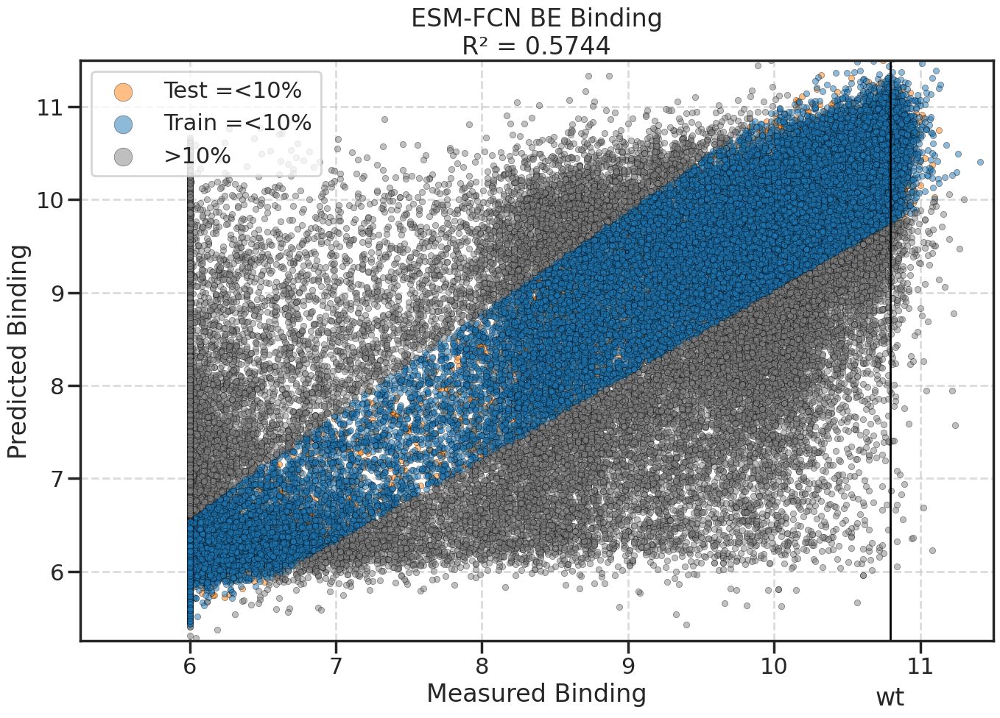

In [27]:
# Binding
df = pd.read_csv("esm_fcn_be/esm_fcn_be.A-predicted_vs_measured.values.csv")
esm_fcn_be_a_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-FCN BE Binding", "esm_fcn_be/esm_fcn_be.A.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.4883493725778363
R^2 outside of threshold: 0.05804153503709808
R^2 inside of threshold: 0.9400695015279903
Number of TRAIN points outside of error threshold: 41872, or 50.95% of all train points
Number of TEST points outside of error threshold: 10759, or 52.04% of all test points


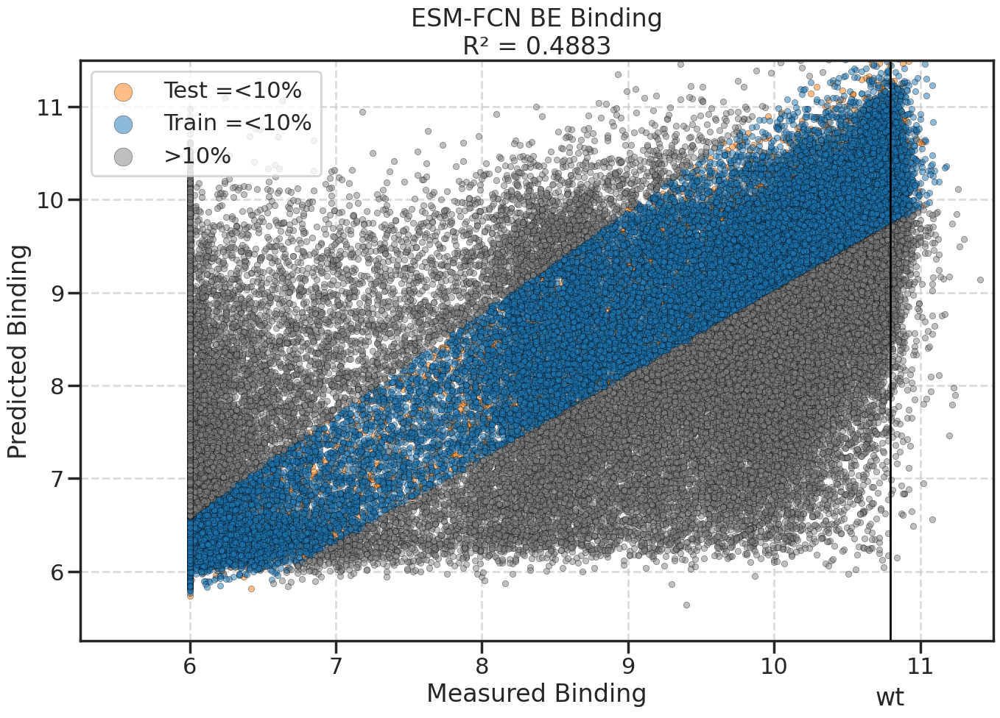

In [28]:
df = pd.read_csv("esm_fcn_be/esm_fcn_be.B-predicted_vs_measured.values.csv")
esm_fcn_be_b_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-FCN BE Binding", "esm_fcn_be/esm_fcn_be.B.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.9264516829765808
R^2 outside of threshold: -0.5362820157004928
R^2 inside of threshold: 0.9881481644093298
Number of TRAIN points outside of error threshold: 0, or 0.00% of all train points
Number of TEST points outside of error threshold: 1913, or 9.25% of all test points


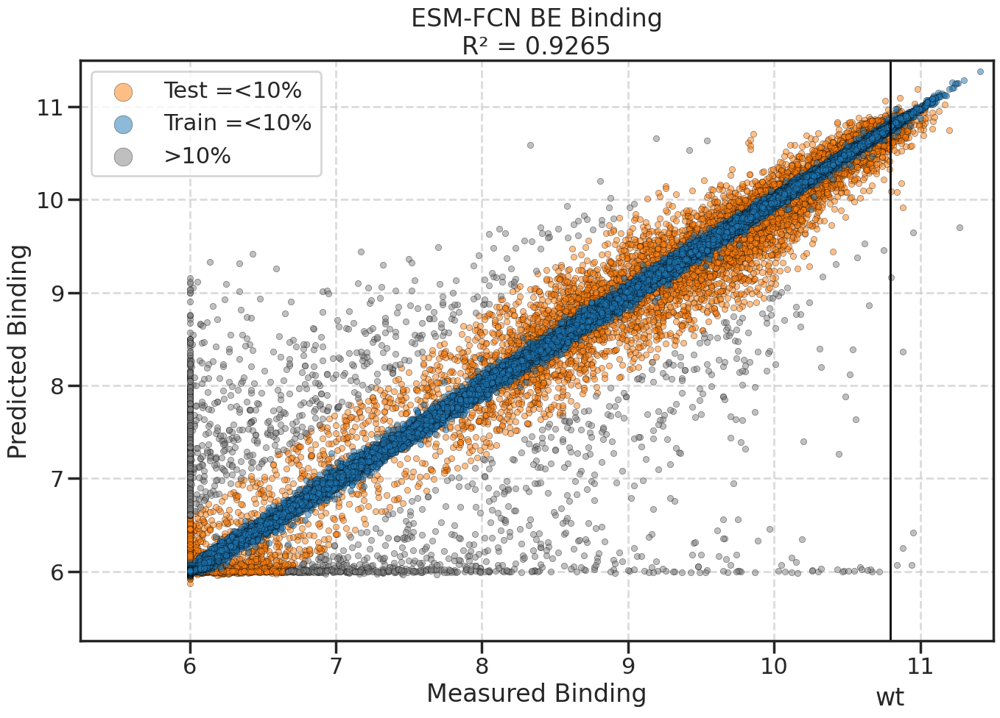

In [29]:
df = pd.read_csv("esm_fcn_be/esm_fcn_be.C-predicted_vs_measured.values.csv")
esm_fcn_be_c_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-FCN BE Binding", "esm_fcn_be/esm_fcn_be.C.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.9178899375350046
R^2 outside of threshold: -0.7598173187557908
R^2 inside of threshold: 0.9852269420424584
Number of TRAIN points outside of error threshold: 2648, or 3.22% of all train points
Number of TEST points outside of error threshold: 1885, or 9.12% of all test points


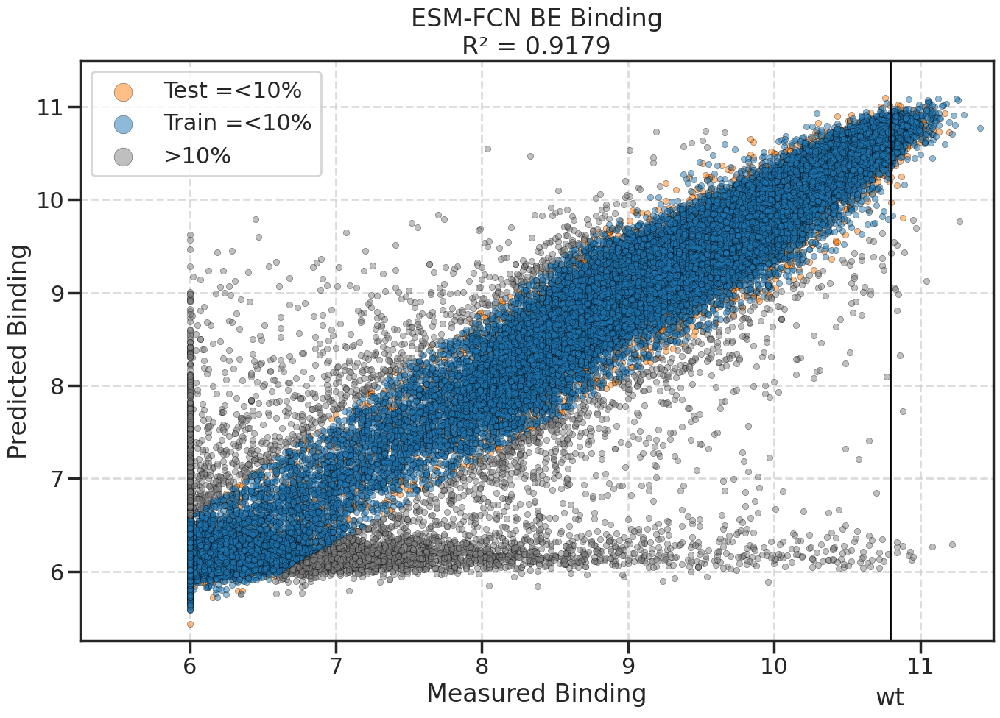

In [30]:
df = pd.read_csv("esm_fcn_be/esm_fcn_be.D-predicted_vs_measured.values.csv")
esm_fcn_be_d_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-FCN BE Binding", "esm_fcn_be/esm_fcn_be.D.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.521355074860756
R^2 outside of threshold: -0.027880700099963907
R^2 inside of threshold: 0.9434044827689327
Number of TRAIN points outside of error threshold: 33755, or 41.08% of all train points
Number of TEST points outside of error threshold: 9547, or 46.18% of all test points


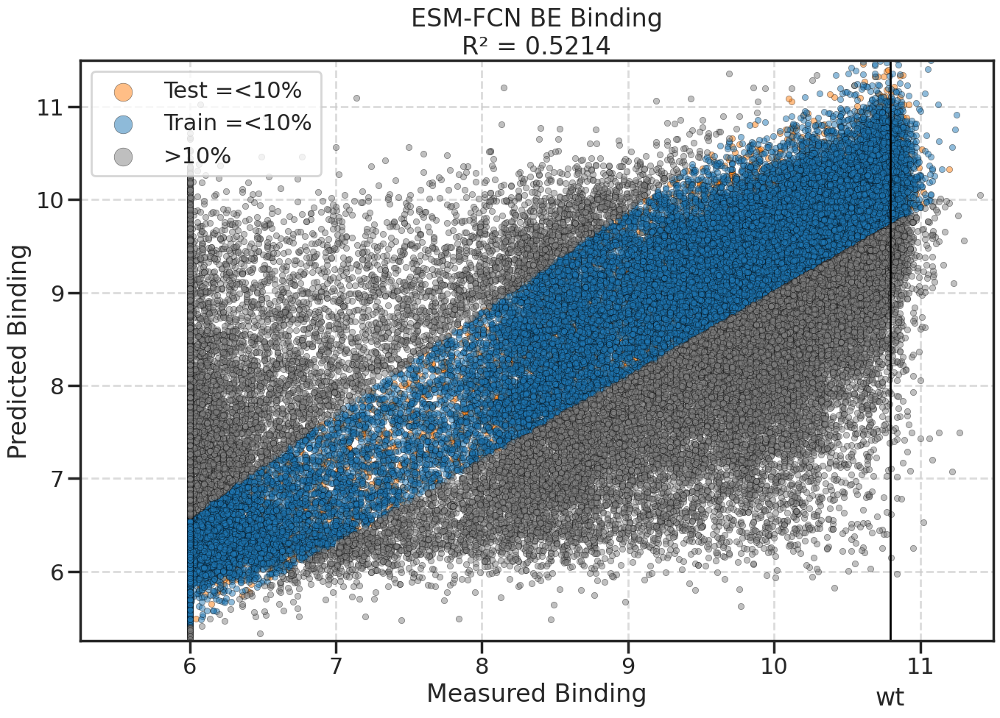

In [31]:
df = pd.read_csv("esm_fcn_be/esm_fcn_be.E-predicted_vs_measured.values.csv")
esm_fcn_be_e_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-FCN BE Binding", "esm_fcn_be/esm_fcn_be.E.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.41531858649852793
R^2 outside of threshold: 0.021322175342612937
R^2 inside of threshold: 0.933364692430889
Number of TRAIN points outside of error threshold: 45816, or 55.75% of all train points
Number of TEST points outside of error threshold: 11718, or 56.68% of all test points


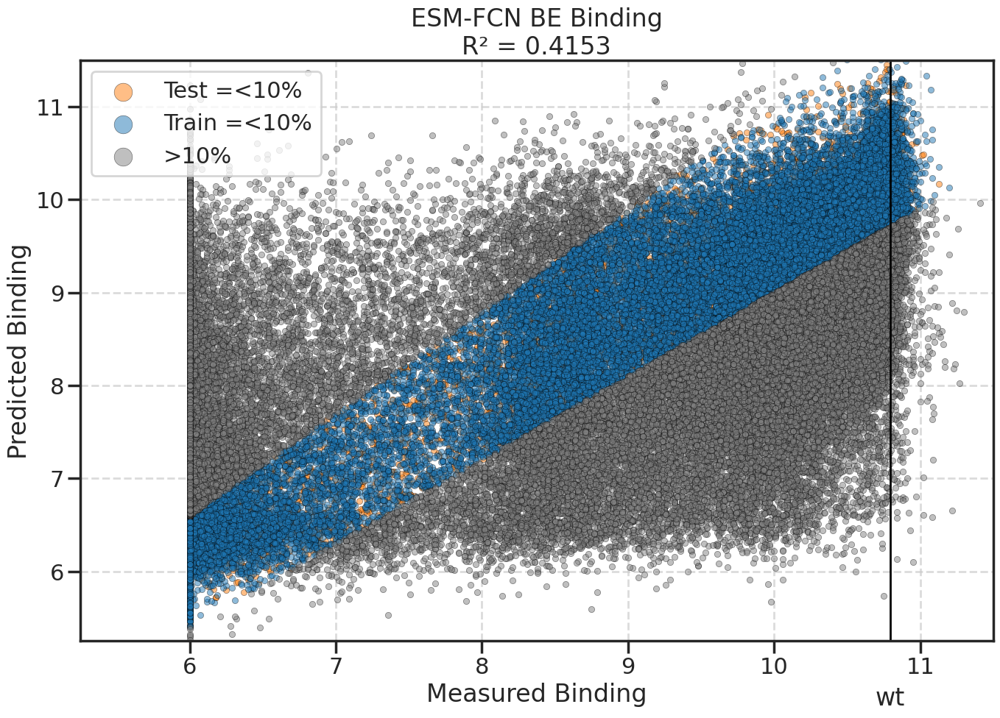

In [32]:
df = pd.read_csv("esm_fcn_be/esm_fcn_be.F-predicted_vs_measured.values.csv")
esm_fcn_be_f_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-FCN BE Binding", "esm_fcn_be/esm_fcn_be.F.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.9288423439685017
R^2 outside of threshold: -0.6131412844209967
R^2 inside of threshold: 0.987929125919824
Number of TRAIN points outside of error threshold: 0, or 0.00% of all train points
Number of TEST points outside of error threshold: 1810, or 8.76% of all test points


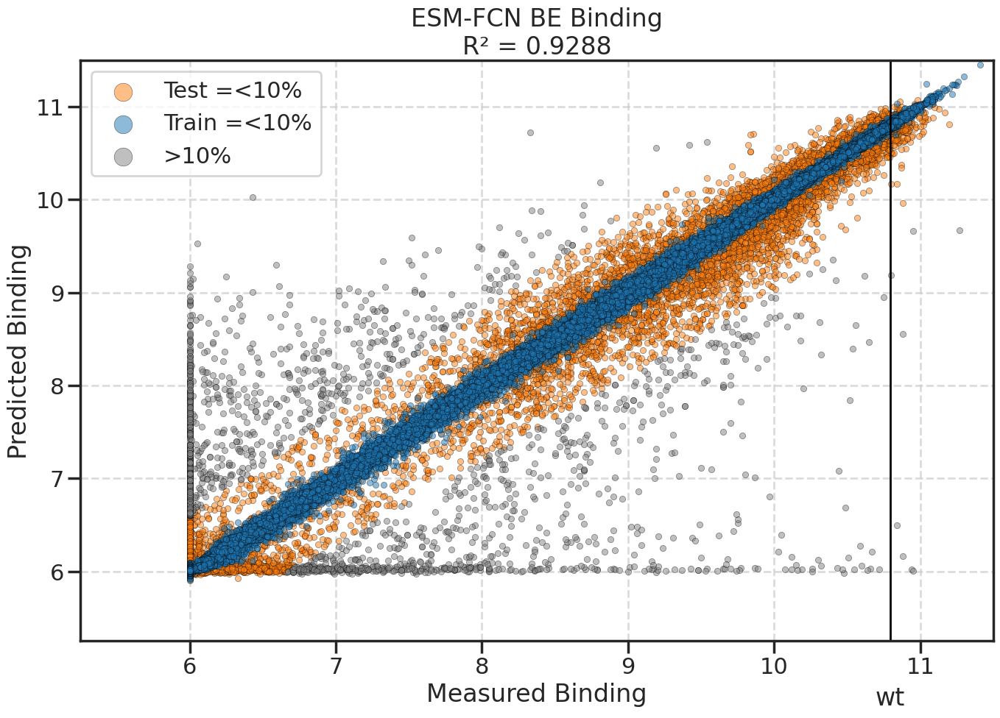

In [33]:
df = pd.read_csv("esm_fcn_be/esm_fcn_be.G-predicted_vs_measured.values.csv")
esm_fcn_be_g_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-FCN BE Binding", "esm_fcn_be/esm_fcn_be.G.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.926396659867077
R^2 outside of threshold: -0.7454996389215138
R^2 inside of threshold: 0.985465155127067
Number of TRAIN points outside of error threshold: 2950, or 3.59% of all train points
Number of TEST points outside of error threshold: 1689, or 8.17% of all test points


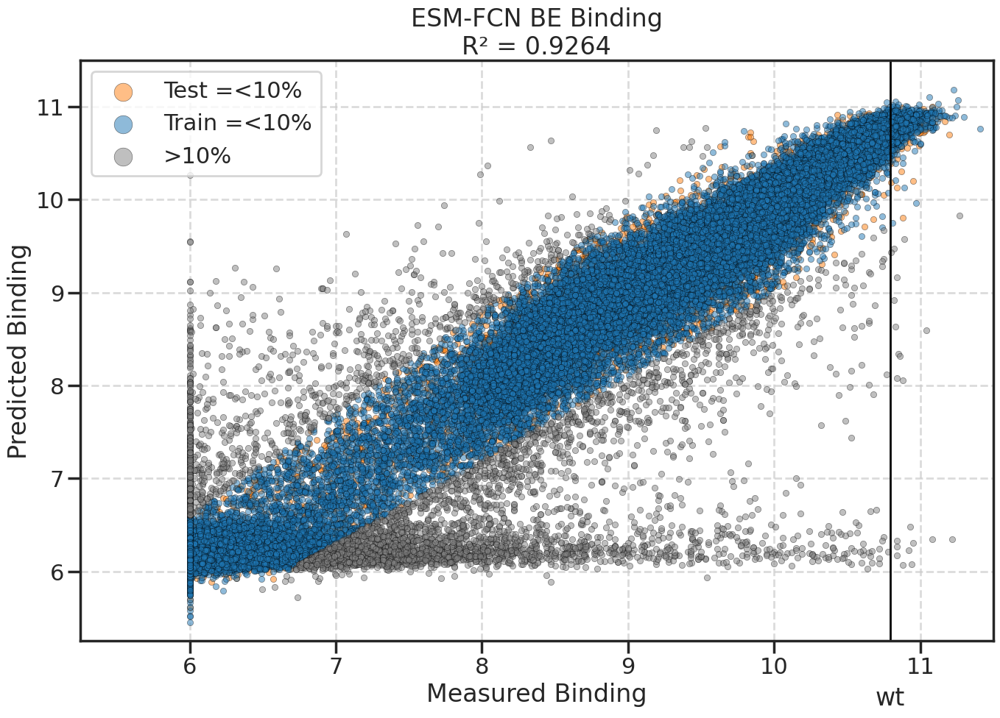

In [34]:
df = pd.read_csv("esm_fcn_be/esm_fcn_be.H-predicted_vs_measured.values.csv")
esm_fcn_be_h_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-FCN BE Binding", "esm_fcn_be/esm_fcn_be.H.binding-predicted_vs_measured.scatter", binding_wt)

Expression

R^2: 0.5753119603729757
R^2 outside of threshold: -0.1565998996256761
R^2 inside of threshold: 0.8214465356663665


Number of TRAIN points outside of error threshold: 11465, or 13.95% of all train points
Number of TEST points outside of error threshold: 3530, or 17.08% of all test points


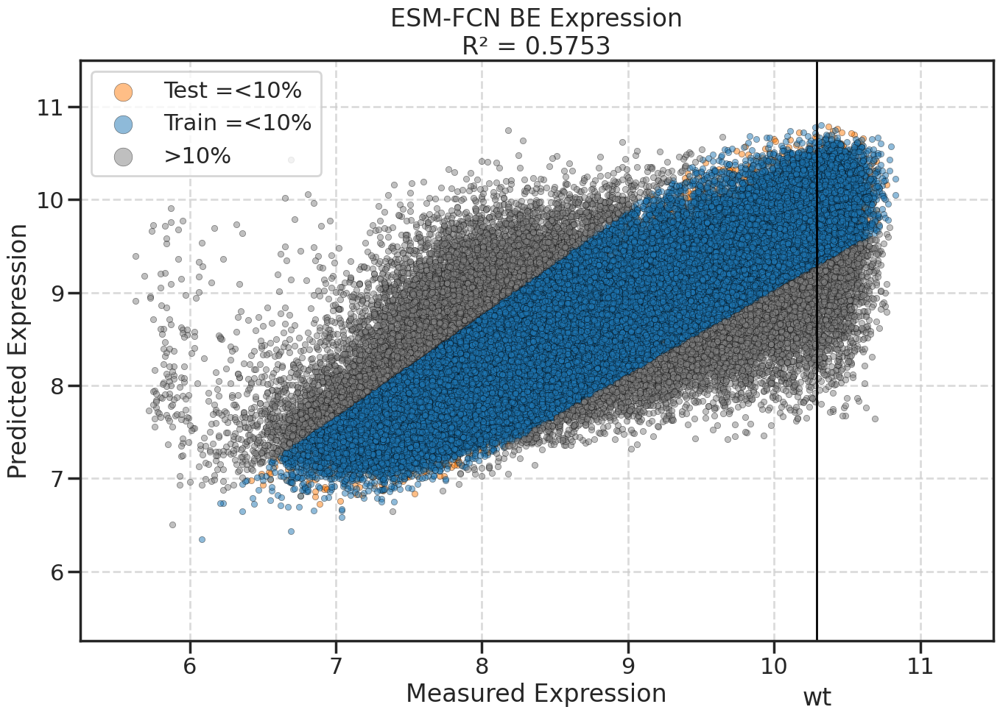

In [35]:
df = pd.read_csv("esm_fcn_be/esm_fcn_be.A-predicted_vs_measured.values.csv")
esm_fcn_be_a_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-FCN BE Expression", "esm_fcn_be/esm_fcn_be.A.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.43307461403575853
R^2 outside of threshold: -0.03817681068773582
R^2 inside of threshold: 0.7443149674082601
Number of TRAIN points outside of error threshold: 18616, or 22.65% of all train points
Number of TEST points outside of error threshold: 4885, or 23.63% of all test points


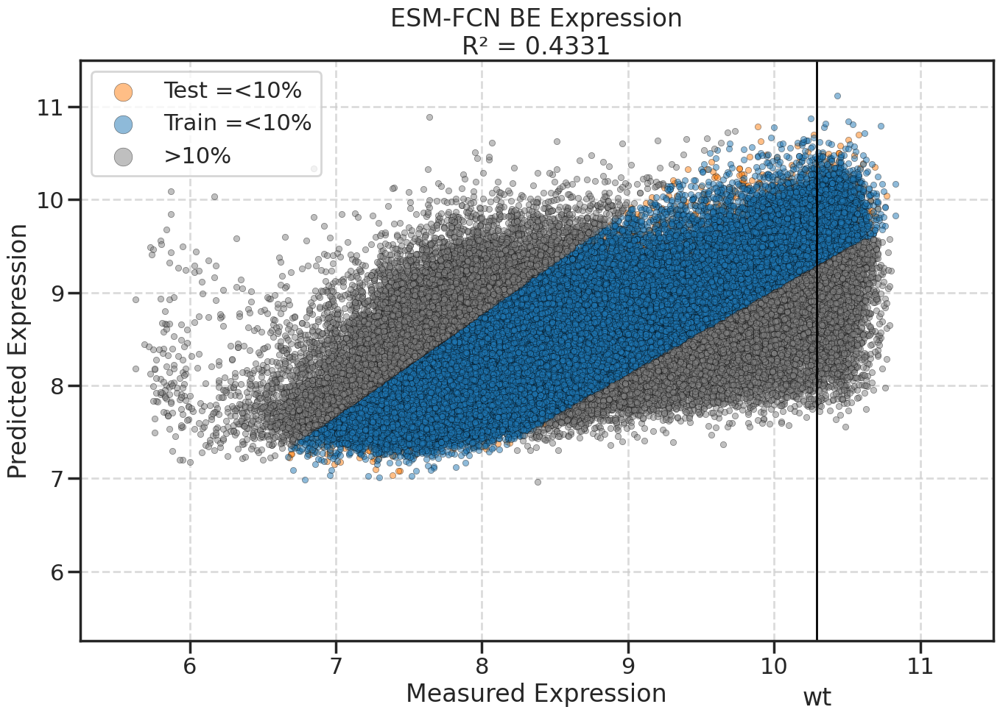

In [36]:
df = pd.read_csv("esm_fcn_be/esm_fcn_be.B-predicted_vs_measured.values.csv")
esm_fcn_be_b_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-FCN BE Expression", "esm_fcn_be/esm_fcn_be.B.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.8978664563187445
R^2 outside of threshold: -0.1805667631735286
R^2 inside of threshold: 0.9244731345329202
Number of TRAIN points outside of error threshold: 0, or 0.00% of all train points
Number of TEST points outside of error threshold: 427, or 2.07% of all test points


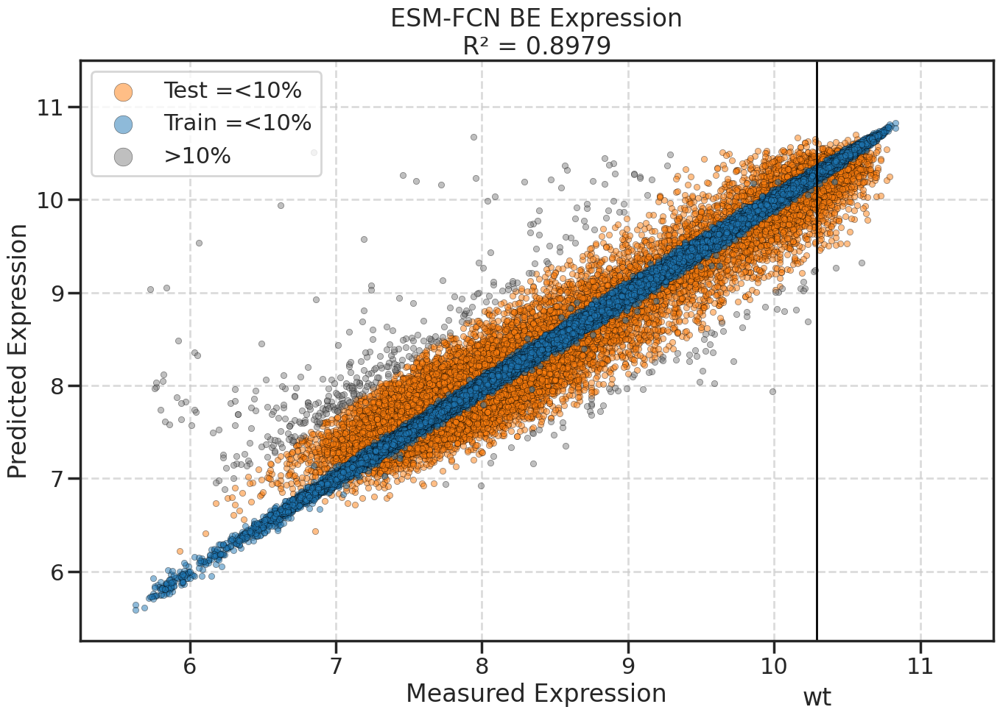

In [37]:
df = pd.read_csv("esm_fcn_be/esm_fcn_be.C-predicted_vs_measured.values.csv")
esm_fcn_be_c_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-FCN BE Expression", "esm_fcn_be/esm_fcn_be.C.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.8847849243191359
R^2 outside of threshold: -0.15882832063174224
R^2 inside of threshold: 0.917472359943665
Number of TRAIN points outside of error threshold: 1242, or 1.51% of all train points
Number of TEST points outside of error threshold: 536, or 2.59% of all test points


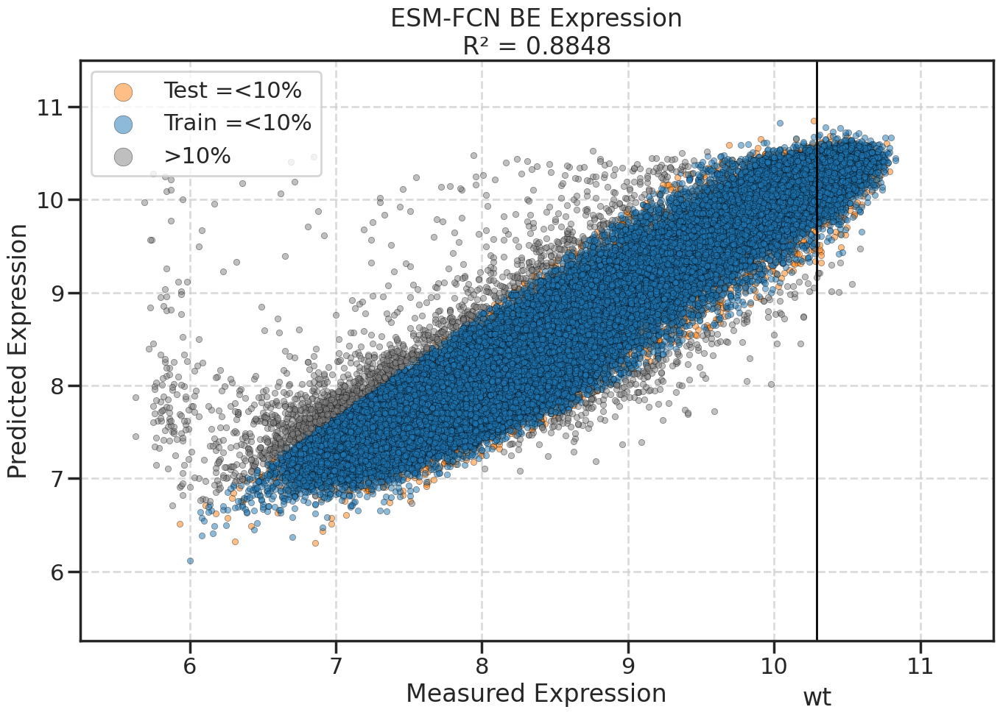

In [38]:
df = pd.read_csv("esm_fcn_be/esm_fcn_be.D-predicted_vs_measured.values.csv")
esm_fcn_be_d_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-FCN BE Expression", "esm_fcn_be/esm_fcn_be.D.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.4630646387090237
R^2 outside of threshold: -0.08478046147408125
R^2 inside of threshold: 0.7739706501292213
Number of TRAIN points outside of error threshold: 16106, or 19.60% of all train points
Number of TEST points outside of error threshold: 4771, or 23.08% of all test points


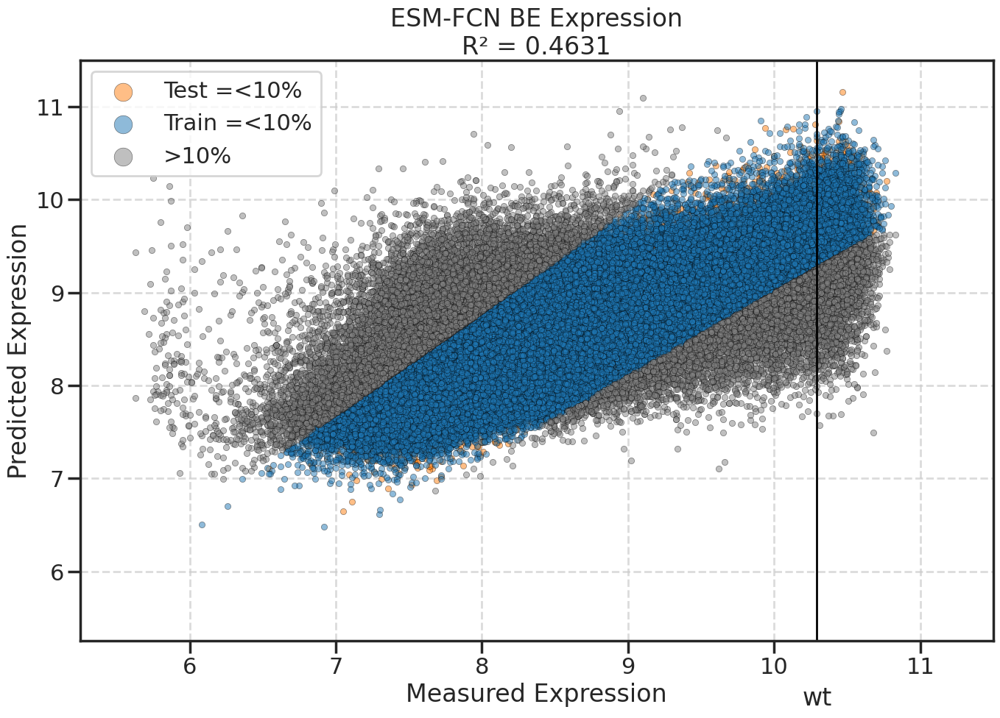

In [39]:
df = pd.read_csv("esm_fcn_be/esm_fcn_be.E-predicted_vs_measured.values.csv")
esm_fcn_be_e_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-FCN BE Expression", "esm_fcn_be/esm_fcn_be.E.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.3312089533825966
R^2 outside of threshold: -0.04465824736253232
R^2 inside of threshold: 0.6975569414653449
Number of TRAIN points outside of error threshold: 23008, or 28.00% of all train points
Number of TEST points outside of error threshold: 5992, or 28.98% of all test points


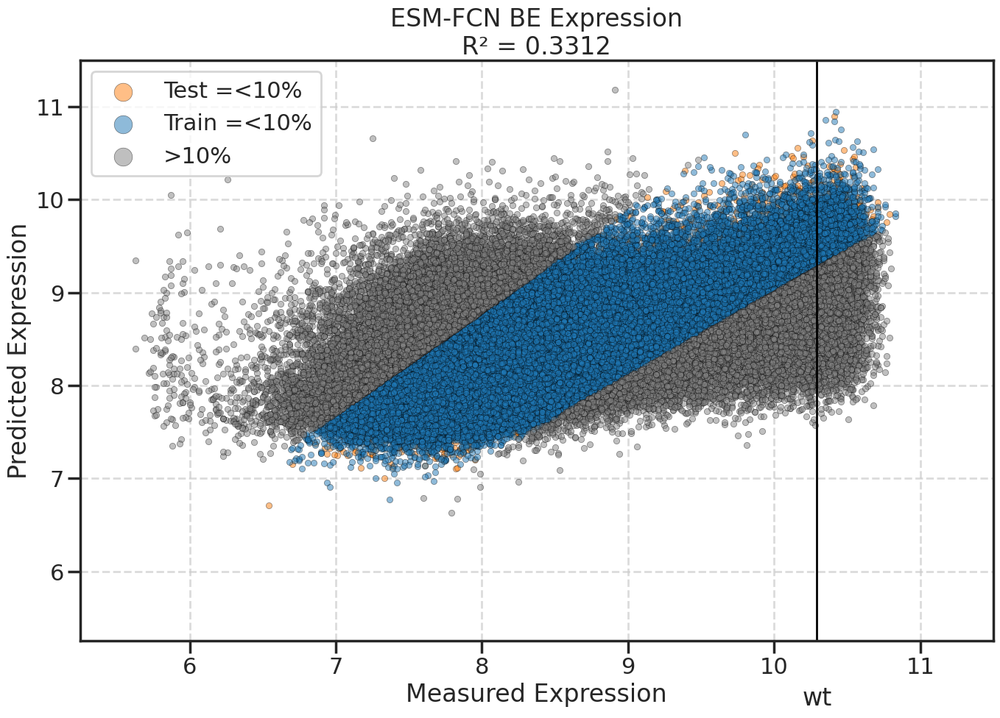

In [40]:
df = pd.read_csv("esm_fcn_be/esm_fcn_be.F-predicted_vs_measured.values.csv")
esm_fcn_be_f_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-FCN BE Expression", "esm_fcn_be/esm_fcn_be.F.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.8953604403230503
R^2 outside of threshold: -0.23450716256846404
R^2 inside of threshold: 0.922875007443
Number of TRAIN points outside of error threshold: 0, or 0.00% of all train points
Number of TEST points outside of error threshold: 454, or 2.20% of all test points


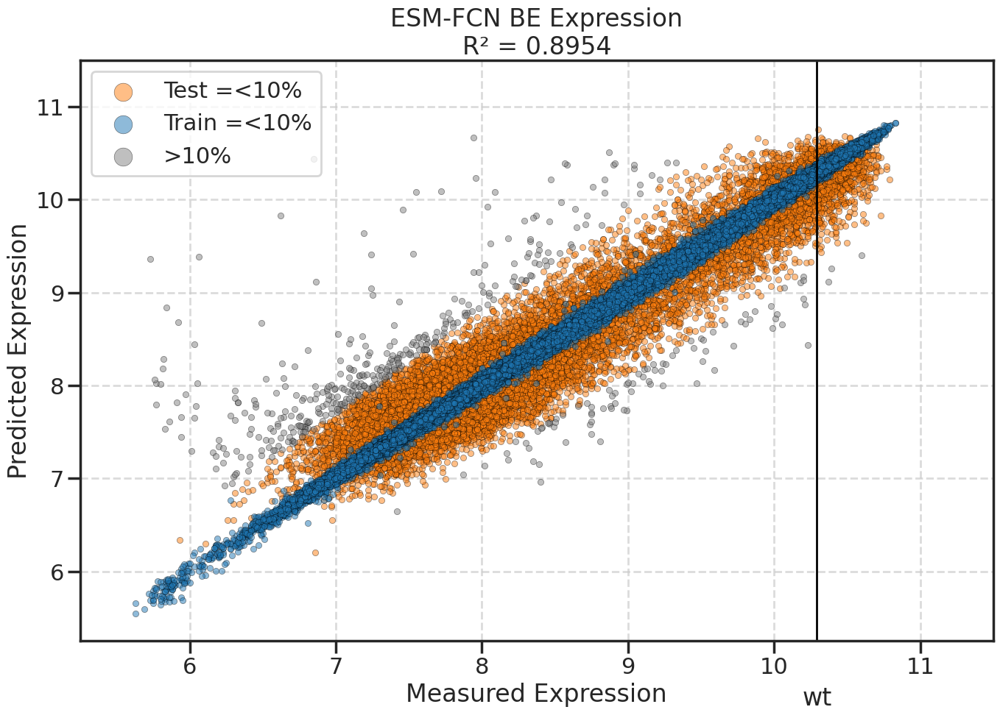

In [41]:
df = pd.read_csv("esm_fcn_be/esm_fcn_be.G-predicted_vs_measured.values.csv")
esm_fcn_be_g_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-FCN BE Expression", "esm_fcn_be/esm_fcn_be.G.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.8916018481497586
R^2 outside of threshold: -0.208839677440523
R^2 inside of threshold: 0.9212087744909997
Number of TRAIN points outside of error threshold: 1288, or 1.57% of all train points
Number of TEST points outside of error threshold: 460, or 2.23% of all test points


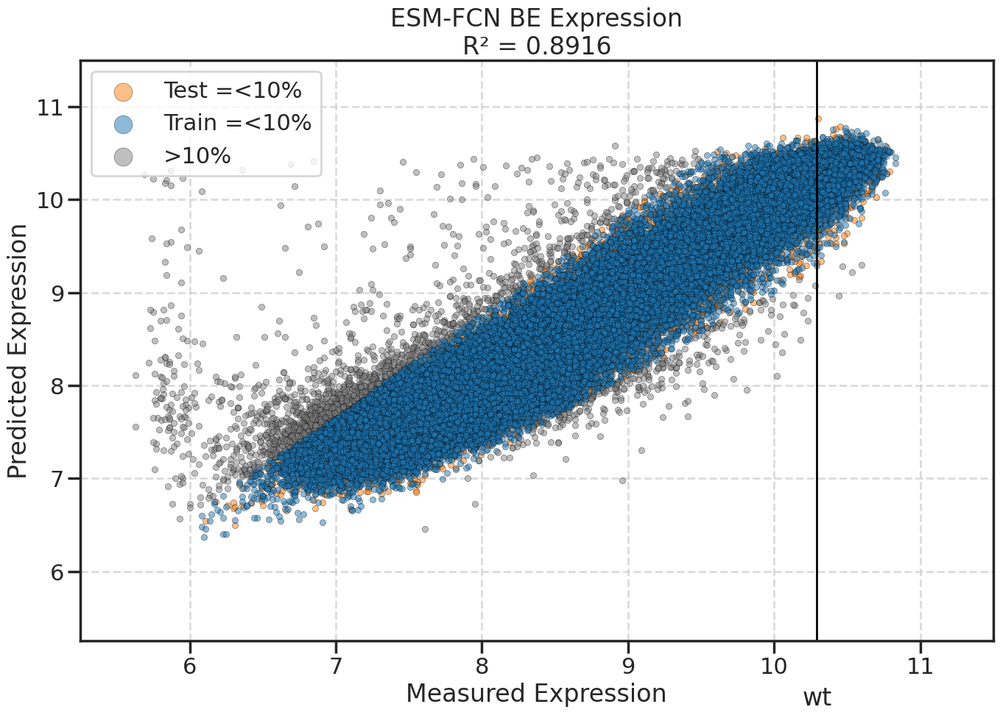

In [42]:
df = pd.read_csv("esm_fcn_be/esm_fcn_be.H-predicted_vs_measured.values.csv")
esm_fcn_be_h_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-FCN BE Expression", "esm_fcn_be/esm_fcn_be.H.expression-predicted_vs_measured.scatter", expression_wt)

---
### Bar Chart Stats

In [7]:
r2_dict = {
    "A.binding": esm_fcn_be_a_binding,
    "A.expression": esm_fcn_be_a_expression,
    "B.binding": esm_fcn_be_b_binding,
    "B.expression": esm_fcn_be_b_expression,
    "C.binding": esm_fcn_be_c_binding,
    "C.expression": esm_fcn_be_c_expression,
    "D.binding": esm_fcn_be_d_binding,
    "D.expression": esm_fcn_be_d_expression,
    "E.binding": esm_fcn_be_e_binding,
    "E.expression": esm_fcn_be_e_expression,
    "F.binding": esm_fcn_be_f_binding,
    "F.expression": esm_fcn_be_f_expression,
    "G.binding": esm_fcn_be_g_binding,
    "G.expression": esm_fcn_be_g_expression,
    "H.binding": esm_fcn_be_h_binding,
    "H.expression": esm_fcn_be_h_expression
}
for key, value in r2_dict.items():
    print(f"{key}: {value}")

A.binding: 0.5744161038160776
A.expression: 0.5753119603729757
B.binding: 0.4883493725778363
B.expression: 0.43307461403575853
C.binding: 0.9264516829765808
C.expression: 0.8978664563187445
D.binding: 0.9178899375350046
D.expression: 0.8847849243191359
E.binding: 0.521355074860756
E.expression: 0.4630646387090237
F.binding: 0.41531858649852793
F.expression: 0.3312089533825966
G.binding: 0.9288423439685017
G.expression: 0.8953604403230503
H.binding: 0.926396659867077
H.expression: 0.8916018481497586


---
### Best RMSE Plots (G BE)

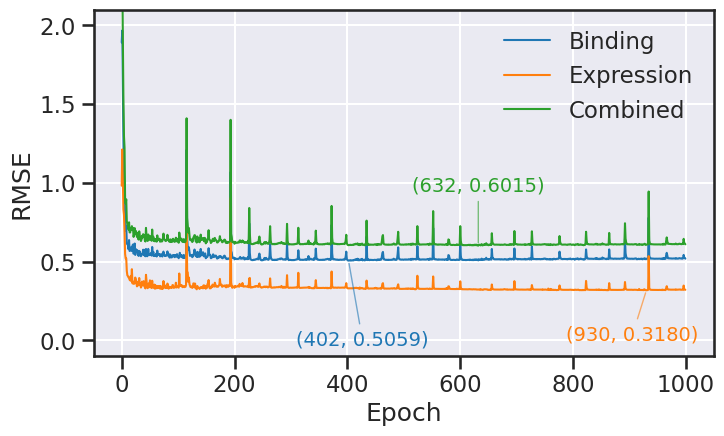

In [6]:
import os 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

log_dir = "../../../../src/pnlp/ESM_TL/logs/"

df = pd.read_csv(
    os.path.join(log_dir, "esm_fcn_be/version_21787564/metrics.csv"), 
    sep=',', 
    header=0,
    usecols=['epoch', 'val_be_rmse', 'val_binding_rmse','val_expression_rmse']
)

# Merge rows for each epoch and keep 'epoch' as a column
merged_df = df.groupby("epoch").ffill().bfill().drop_duplicates().reset_index()

# Ensure 'epoch' is correctly named and exists
if "epoch" not in merged_df.columns:
    merged_df.rename(columns={"index": "epoch"}, inplace=True)  # Rename if it was reset incorrectly

# Divide epoch by 2 to correct numbering
merged_df.loc[:, "epoch"] = (merged_df["epoch"] // 2).astype(int)

# Ensure sorting is correct
merged_df = merged_df.sort_values("epoch").reset_index(drop=True)

binding_best_epoch = merged_df.loc[merged_df['val_binding_rmse'].idxmin()]
expression_best_epoch = merged_df.loc[merged_df['val_expression_rmse'].idxmin()]
be_best_epoch = merged_df.loc[merged_df['val_be_rmse'].idxmin()]

# Plot
sns.set_style('ticks')
sns.set_context('talk')
fig, ax = plt.subplots(figsize=(8, 4.5)) 

# Plot RMSE
ax.plot(merged_df['epoch'], merged_df['val_binding_rmse'], label='Binding', color='tab:blue', linewidth=1.5)
ax.plot(merged_df['epoch'], merged_df['val_expression_rmse'], label='Expression', color='tab:orange', linewidth=1.5)
ax.plot(merged_df['epoch'], merged_df['val_be_rmse'], label='Combined', color='tab:green', linewidth=1.5)
ax.set_xlabel('Epoch')
ax.set_ylim(-50, 1050)
ax.set_ylabel('RMSE')
ax.set_ylim(-0.1, 2.1)
ax.legend(loc='upper right', frameon=False)
plt.grid(axis="y", linestyle="-", alpha=1, color='white')
plt.grid(axis="x", linestyle="-", alpha=1, color='white')
ax.set_facecolor('#EAEAF2') 

ax.annotate(
    f'({int(binding_best_epoch["epoch"])}, {binding_best_epoch["val_binding_rmse"]:.4f})',
    (binding_best_epoch["epoch"], binding_best_epoch["val_binding_rmse"]),
    textcoords="offset points", xytext=(10, -50), ha='center', va='top', color='tab:blue', fontsize=14,
    arrowprops=dict(arrowstyle="-", color='tab:blue', lw=1, alpha=0.6)
)

ax.annotate(
    f'({int(expression_best_epoch["epoch"])}, {expression_best_epoch["val_expression_rmse"]:.4f})',
    (expression_best_epoch["epoch"], expression_best_epoch["val_expression_rmse"]),
    textcoords="offset points", xytext=(-10, -25), ha='center', va='top', color='tab:orange', fontsize=14,
    arrowprops=dict(arrowstyle="-", color='tab:orange', lw=1, alpha=0.6)
)

ax.annotate(
    f'({int(be_best_epoch["epoch"])}, {be_best_epoch["val_be_rmse"]:.4f})',
    (be_best_epoch["epoch"], be_best_epoch["val_be_rmse"]),
    textcoords="offset points", xytext=(0, 50), ha='center', va='top', color='tab:green', fontsize=14,
    arrowprops=dict(arrowstyle="-", color='tab:green', lw=1, alpha=0.6)
)

# Save the figure to the "figures" subdirectory.
save_path = "../../rmse/best_esm_fcn_be-test_metrics"
plt.savefig(f"{save_path}.pdf", format='pdf', dpi=600, bbox_inches='tight')
plt.savefig(f"{save_path}.png", format='png', dpi=600, bbox_inches='tight')